In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from torchvision.utils import make_grid
import random
from PIL import Image
from IPython.display import display
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import confusion_matrix

# Load the data

In [2]:
root = os.getcwd()
path = os.path.join(root, 'traindata')

In [3]:
# Define function to get image names from a directory
def get_image_names(path):
    img_names = []

    for folder, subfolders, filenames in os.walk(path):
        for img in filenames:
            img_names.append(folder+'\\'+img)

    print('Number of images: ',len(img_names))
    return img_names

In [4]:
img_names = get_image_names(path)

Number of images:  3600


In [5]:
# Get image sizes and reject invalid images
img_sizes = []
rejected = []

for item in img_names:
    try:
        with Image.open(item) as img:
            img_sizes.append(img.size)
    except:
        rejected.append(item)
        
print(f'Images:  {len(img_sizes)}')
print(f'Rejects: {len(rejected)}')

Images:  3600
Rejects: 0


# EDA

In [6]:
# Create a DataFrame of image sizes
df = pd.DataFrame(img_sizes)
# Run summary statistics on image widths
df_w = pd.DataFrame(df[0].describe())
df_w.round(1)

,0
count,3600.0
mean,299.5
std,14.9
min,178.0
25%,300.0
50%,300.0
75%,300.0
max,870.0


In [7]:
# Run summary statistics on image heights
df_h = pd.DataFrame(df[1].describe())
df_h.round(1)

,1
count,3600.0
mean,299.3
std,18.0
min,138.0
25%,300.0
50%,300.0
75%,300.0
max,957.0


In [8]:
# Randomly select and display images
randomlist = []
randomlist = random.sample(range(0, 3599), 20)
print(randomlist)

[935, 596, 1733, 3008, 3492, 2021, 784, 1259, 2732, 2186, 1489, 2150, 610, 684, 913, 2552, 24, 2926, 182, 177]


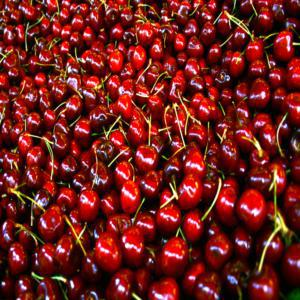

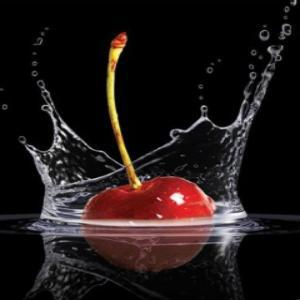

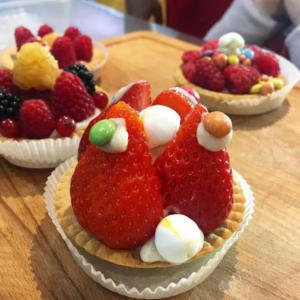

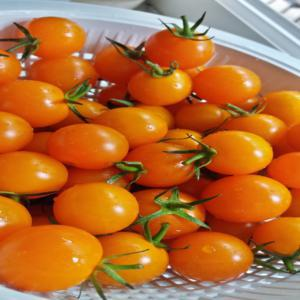

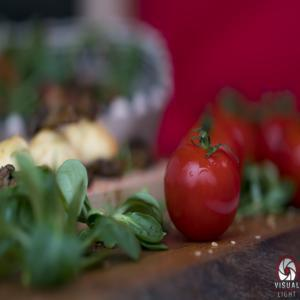

...

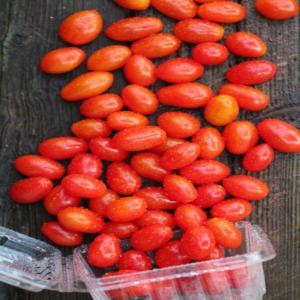

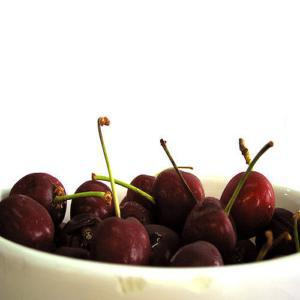

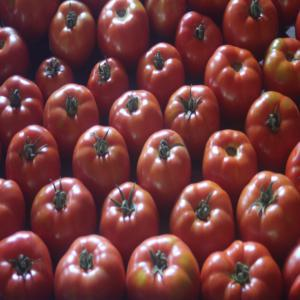

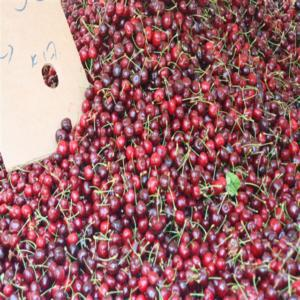

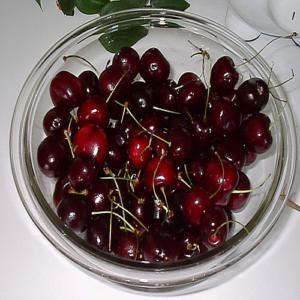

In [9]:
for i in randomlist:
    fruit = Image.open(img_names[i])
    display(fruit)

In [10]:
# Function to plot image histogram
def plotHist(img):
  plt.figure(figsize=(10,5))
  plt.subplot(1,2,1)
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  histo = plt.subplot(1,2,2)
  histo.set_ylabel('Count')
  histo.set_xlabel('Pixel Intensity')
  plt.hist(img.flatten(), bins=10, lw=0, color='r', alpha=0.5)

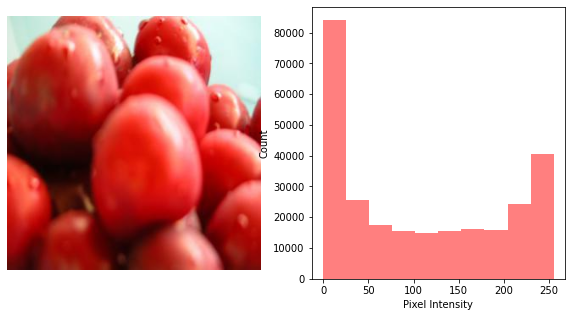

In [11]:
# Plot histogram for a sample image
img = mpimg.imread(img_names[300])
plotHist(img)

In [12]:
# Get paths for each fruit category
cherry_path = os.path.join(path, 'cherry')
strawberry_path = os.path.join(path, 'strawberry')
tomato_path = os.path.join(path, 'tomato')

In [13]:
# Get image names for each fruit category
cherry_img_names = get_image_names(cherry_path)

Number of images:  1200


In [14]:
strawberry_img_names = get_image_names(strawberry_path)

Number of images:  1200


In [15]:
tomato_img_names = get_image_names(tomato_path)

Number of images:  1200


In [16]:
# Function to get RGB values for each fruit category
def get_fruit_rgb(fruit_path):
    r_fruits = []
    g_fruits = []
    b_fruits = []
    for i in range(len(fruit_path)):
        fruit = Image.open(fruit_path[i])
        rgb_image = fruit.convert('RGB')
        r, g, b = rgb_image.getpixel((0, 0))
        r_fruits.append(r)
        g_fruits.append(g)
        b_fruits.append(b)
    return r_fruits, g_fruits, b_fruits

In [17]:
# Get RGB values for each fruit category
r_cherry, g_cherry, b_cherry = get_fruit_rgb(cherry_img_names)
r_strawberry, g_strawberry, b_strawberry = get_fruit_rgb(strawberry_img_names)
r_tomato, g_tomato, b_tomato = get_fruit_rgb(tomato_img_names)

In [18]:
# Create DataFrames for RGB values of each fruit category
rgb_cherry = pd.DataFrame(list(zip(r_cherry, g_cherry, b_cherry)),
               columns = ['R', 'G', 'B'])
rgb_cherry = rgb_cherry.assign(Fruit = 'cherry')

In [19]:
rgb_strawberry = pd.DataFrame(list(zip(r_strawberry, g_strawberry, b_strawberry)),
               columns = ['R', 'G', 'B'])
rgb_strawberry = rgb_strawberry.assign(Fruit = 'strawberry')

In [20]:
rgb_tomato = pd.DataFrame(list(zip(r_tomato, g_tomato, b_tomato)),
               columns = ['R', 'G', 'B'])
rgb_tomato = rgb_tomato.assign(Fruit = 'tomato')

In [21]:
# Combine RGB DataFrames for all fruit categories
fruit_rgb = rgb_cherry.append(rgb_strawberry, ignore_index=True)
fruit_rgb = fruit_rgb.append(rgb_tomato, ignore_index=True)

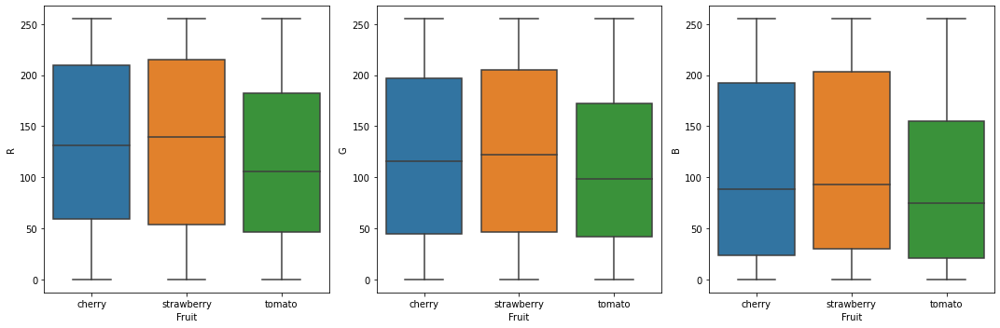

In [22]:
# Plot boxplots for RGB values of each fruit category
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
sns.boxplot(x='Fruit', y='R', data=fruit_rgb, ax=axes[0])
sns.boxplot(x='Fruit', y='G', data=fruit_rgb, ax=axes[1])
sns.boxplot(x='Fruit',y='B', data=fruit_rgb, ax=axes[2])
fig.tight_layout()
plt.show()

# Apply data pre-processing/ data transformation

In [23]:
# Define data transformations for training and testing
train_transform = transforms.Compose([
        transforms.RandomRotation(10),      # rotate +/- 10 degrees
        transforms.RandomHorizontalFlip(),  # reverse 50% of images
        transforms.Resize(224),             # resize shortest side to 224 pixels
        transforms.CenterCrop(224),         # crop longest side to 224 pixels at center
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

test_transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

In [24]:
# Load the datasets with the defined transformations
train_data = datasets.ImageFolder(os.path.join(root, 'traindata'), transform=train_transform)
test_data = datasets.ImageFolder(os.path.join(root, 'testdata'), transform=test_transform)

# Create data loaders for training and testing
torch.manual_seed(42)
train_loader = DataLoader(train_data, batch_size=100, shuffle=True)
test_loader = DataLoader(test_data, batch_size=100, shuffle=True)

# Get class names and print dataset information
class_names = train_data.classes

print(class_names)
print(f'Training images available: {len(train_data)}')
print(f'Testing images available:  {len(test_data)}')

['cherry', 'strawberry', 'tomato']
Training images available: 3600
Testing images available:  900


Label: [2 1 2 2 0 2 0 1 2 0 1 0 0 2 1 2 1 0 2 2 0 2 1 2 2 0 1 2 2 1 2 1 2 2 1 1 2
 0 1 2 0 1 1 0 0 2 1 1 2 2 1 0 2 0 0 1 1 2 2 0 1 0 1 1 1 1 0 2 0 0 0 2 0 1
 1 1 2 2 2 0 0 2 1 2 0 1 2 0 1 2 0 2 2 2 2 1 1 0 0 0]
Class: tomato strawberry tomato tomato cherry tomato cherry strawberry tomato cherry strawberry cherry cherry tomato strawberry tomato strawberry cherry tomato tomato cherry tomato strawberry tomato tomato cherry strawberry tomato tomato strawberry tomato strawberry tomato tomato strawberry strawberry tomato cherry strawberry tomato cherry strawberry strawberry cherry cherry tomato strawberry strawberry tomato tomato strawberry cherry tomato cherry cherry strawberry strawberry tomato tomato cherry strawberry cherry strawberry strawberry strawberry strawberry cherry tomato cherry cherry cherry tomato cherry strawberry strawberry strawberry tomato tomato tomato cherry cherry tomato strawberry tomato cherry strawberry tomato cherry strawberry tomato cherry tomato tomato tomato toma

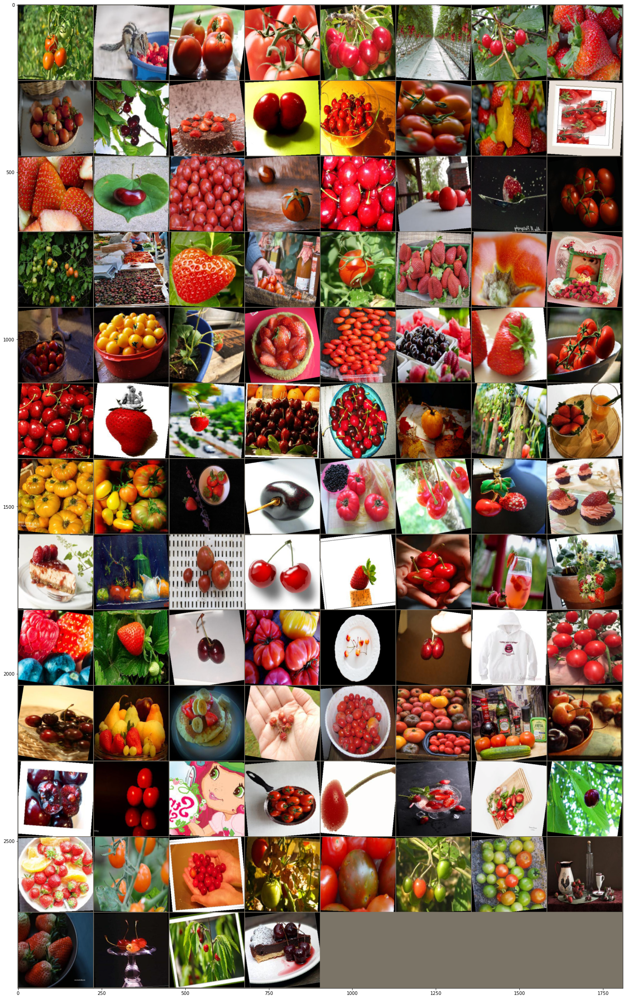

In [25]:
# Grab the first batch of 100 images
for images,labels in train_loader: 
    break

# Print the labels
print('Label:', labels.numpy())
print('Class:', *np.array([class_names[i] for i in labels]))

# Create a grid of images and display it
im = make_grid(images)

# Inverse normalize the images
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
im_inv = inv_normalize(im)

# Print the images
plt.figure(figsize=(80,40))
plt.imshow(np.transpose(im_inv.numpy(), (1, 2, 0)));

# MLP baseline model

In [26]:
# Define the Multilayer Perceptron (MLP) model
class MultilayerPerceptron(nn.Module):
    def __init__(self, in_sz=150528, out_sz=3, layers=[120,84]):
        super().__init__()
        self.fc1 = nn.Linear(in_sz, layers[0])
        self.fc2 = nn.Linear(layers[0], layers[1])
        self.fc3 = nn.Linear(layers[1], out_sz)
    
    def forward(self,X):
        X = F.relu(self.fc1(X))
        X = F.relu(self.fc2(X))
        X = self.fc3(X)
        return F.log_softmax(X, dim=1)

In [27]:
# Initialize the MLP model
torch.manual_seed(42)
model_mlp = MultilayerPerceptron()
model_mlp

MultilayerPerceptron(
  (fc1): Linear(in_features=150528, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=3, bias=True)
)

In [28]:
# Function to count the number of parameters in a model
def count_parameters(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    for item in params:
        print(f'{item:>8}')
    print(f'______\n{sum(params):>8}')

In [29]:
count_parameters(model_mlp)

18063360
     120
   10080
      84
     252
       3
______
18073899


## Train the model

In [30]:
# Define the loss function and optimizer for the MLP model
criterion_mlp = nn.CrossEntropyLoss()
optimizer_mlp = torch.optim.Adam(model_mlp.parameters(), lr=0.001, weight_decay=1e-5)
epochs_mlp = 8

In [31]:
for images, labels in train_loader:
    print('Batch shape:', images.size())
    break

Batch shape: torch.Size([100, 3, 224, 224])


In [32]:
images.view(100,-1).size()

torch.Size([100, 150528])

In [33]:
# Function to train a model
def train_model(model, train_loader, test_loader, criterion, optimizer, epochs):
    train_losses = []
    test_losses = []
    train_correct = []
    test_correct = []
    for i in range(epochs):
        trn_corr = 0
        tst_corr = 0
        # Run the training batches
        for (X_train, y_train) in train_loader:
            # Apply the model
            if model == model_mlp:
                y_pred = model(X_train.view(100, -1))
            else:
                y_pred = model(X_train)
            loss = criterion(y_pred, y_train) 
            # Tally the number of correct predictions
            predicted = torch.max(y_pred.data, 1)[1]
            batch_corr = (predicted == y_train).sum()
            trn_corr += batch_corr        
            # Update parameters
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        # Update train loss & accuracy for the epoch 
        train_losses.append(loss)
        train_correct.append(trn_corr)
        # Run the testing batches
        with torch.no_grad():
            for (X_test, y_test) in test_loader:
                # Apply the model
                if model == model_mlp:
                    y_val = model(X_test.view(100, -1))
                else:
                    y_val = model(X_test)
                # Tally the number of correct predictions
                predicted = torch.max(y_val.data, 1)[1] 
                tst_corr += (predicted == y_test).sum()
        loss = criterion(y_val, y_test)
        test_losses.append(loss)
        test_correct.append(tst_corr)
    return train_losses, test_losses, train_correct, test_correct

In [34]:
# Function to calculate training accuracies
def get_train_accuracies(train_correct):
    train_accuracies = []
    for n in range(len(train_correct)):
        train_accuracy = train_correct[n]*100/len(train_data)
        train_accuracies.append(train_accuracy)
    return train_accuracies

In [35]:
# Function to calculate testing accuracies
def get_test_accuracies(test_correct):
    test_accuracies = []
    for n in range(len(test_correct)):
        test_accuracy = test_correct[n]*100/len(test_data)
        test_accuracies.append(test_accuracy)
    return test_accuracies

In [63]:
# Function to plot losses
def plot_losses(train_losses, test_losses):
    train_losses = [t.item() for t in train_losses]
    test_losses = [t.item() for t in test_losses]
    plt.plot(train_losses, label='training loss')
    plt.plot(test_losses, label='validation loss')
    plt.xticks(np.arange(len(train_losses)), np.arange(1, len(train_losses)+1))
    plt.title('Loss at each epoch')
    plt.legend()

In [37]:
# Function to plot accuracies
def plot_accuracies(train_accuracies, test_accuracies):
    plt.plot(train_accuracies, label='training accuracy')
    plt.plot(test_accuracies, label='validation accuracy')
    plt.xticks(np.arange(len(train_accuracies)), np.arange(1, len(train_accuracies)+1))
    plt.title('Accuracy at each epoch')
    plt.legend()

In [49]:
# Train the MLP model
train_losses_mlp, test_losses_mlp, train_correct_mlp, test_correct_mlp = train_model(model_mlp, train_loader, test_loader, criterion_mlp, optimizer_mlp, epochs_mlp)

In [39]:
# Calculate training and testing accuracies for the MLP model
train_accuracies_mlp = get_train_accuracies(train_correct_mlp)
test_accuracies_mlp = get_test_accuracies(test_correct_mlp)

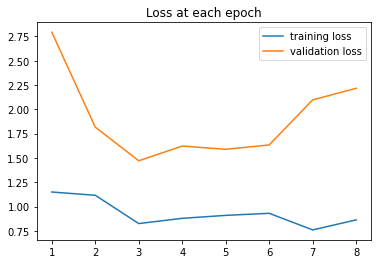

In [65]:
# Plot losses for the MLP model
plot_losses(train_losses_mlp, test_losses_mlp)

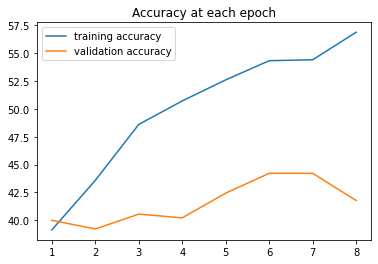

In [47]:
# Plot accuracies for the MLP model
plot_accuracies(train_accuracies_mlp, test_accuracies_mlp)

## Evaluate model performance

In [51]:
print(f'Train accuracy: {train_accuracies_mlp[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_mlp[-1].item():.2f}%')
print(f'Train loss: {train_losses_mlp[-1].item():.2f}')
print(f'Test loss: {test_losses_mlp[-1].item():.2f}')

Train accuracy: 56.89%
Test accuracy: 41.78%
Train loss: 0.86
Test loss: 2.22


## Display the confusion matrix

In [52]:
# Function to create a confusion matrix
def create_cf(test_data, model):
    # Create a loader for the entire the test set
    test_load_all = DataLoader(test_data, batch_size=900, shuffle=True)
    with torch.no_grad():
        correct = 0
        for X_test, y_test in test_load_all:
            if model == model_mlp:
                y_val = model_mlp(X_test.view(900, -1)) 
            else:
                y_val = model(X_test) 
            predicted = torch.max(y_val,1)[1]
            correct += (predicted == y_test).sum()

    arr = confusion_matrix(y_test.view(-1), predicted.view(-1))
    df_cm = pd.DataFrame(arr, class_names, class_names)
    plt.figure(figsize = (9,6))
    sns.heatmap(df_cm, annot=True, fmt="d", cmap='BuGn')
    plt.xlabel("Predicted value")
    plt.ylabel("True value")
    plt.show()
    
    return predicted, X_test, y_test

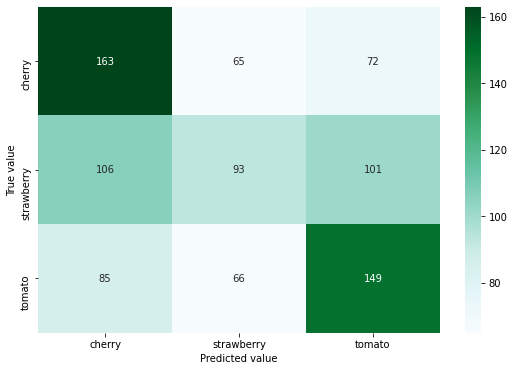

In [53]:
predicted_mlp, X_test_mlp, y_test_mlp = create_cf(test_data, model_mlp)

## Examine the misses

In [54]:
def get_missed_predictions(predicted, X_test, y_test):
    misses = np.array([])
    for i in range(len(predicted.view(-1))):
        if predicted[i] != y_test[i]:
            misses = np.append(misses,i).astype('int64')
    # Set up an iterator to feed batched rows
    r = 20   # row size
    row = iter(np.array_split(misses,len(misses)//r+1))
    np.set_printoptions(formatter=dict(int=lambda x: f'{x:5}')) # to widen the printed array

    nextrow = next(row)
    lbls = y_test.index_select(0,torch.tensor(nextrow)).numpy()
    gues = predicted.index_select(0,torch.tensor(nextrow)).numpy()
    print("Index:", nextrow)
    print("Label:", lbls)
    print("Class: ", *np.array([class_names[i] for i in lbls]))
    print()
    print("Guess:", gues)
    print("Class: ", *np.array([class_names[i] for i in gues]))

    images = X_test.index_select(0,torch.tensor(nextrow))
    im = make_grid(images, nrow=r)
    inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225])
    im_inv = inv_normalize(im)
    plt.figure(figsize=(50,25))
    plt.imshow(np.transpose(im_inv.numpy(), (1, 2, 0)))

Index: [    0     1     2     9    10    11    12    13    14    16    18    19
    20    22    23    25    28    29    30    32]
Label: [    0     1     1     1     0     0     1     2     2     1     1     0
     2     0     2     2     0     2     2     1]
Class:  cherry strawberry strawberry strawberry cherry cherry strawberry tomato tomato strawberry strawberry cherry tomato cherry tomato tomato cherry tomato tomato strawberry

Guess: [    2     0     0     0     1     2     0     1     1     0     2     2
     0     1     0     0     2     0     1     2]
Class:  tomato cherry cherry cherry strawberry tomato cherry strawberry strawberry cherry tomato tomato cherry strawberry cherry cherry tomato cherry strawberry tomato


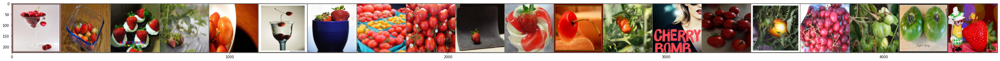

In [55]:
get_missed_predictions(predicted_mlp, X_test_mlp, y_test_mlp)

# CNN model

In [56]:
class ConvolutionalNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 3, 1) #3 input color channels, 6 filters (output channels), kernel size 3x3, stride 1
        self.conv2 = nn.Conv2d(6, 16, 3, 1) #6 filters, 16 filters
        self.fc1 = nn.Linear(54*54*16, 120) #120 flattened out neurons
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 3)
        self.dropout = nn.Dropout(0.25)

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2) #kernel size 2, stride 2
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, 54*54*16)
        X = self.dropout(X)
        X = F.relu(self.fc1(X))
        X = self.dropout(X)
        X = F.relu(self.fc2(X))
        X = self.fc3(X)
        return F.log_softmax(X, dim=1)

In [57]:
# Initialize the CNN model
torch.manual_seed(42)
CNNmodel = ConvolutionalNetwork()
CNNmodel

ConvolutionalNetwork(
  (conv1): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=46656, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=3, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
)

In [58]:
# Count the number of trainable parameters in the model
count_parameters(CNNmodel)

     162
       6
     864
      16
 5598720
     120
   10080
      84
     252
       3
______
 5610307


## Train the model

In [59]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [60]:
# Train the model
train_losses, test_losses, train_correct, test_correct = train_model(CNNmodel, train_loader, test_loader, criterion, optimizer, epochs)

In [61]:
# Calculate training and testing accuracies
train_accuracies = get_train_accuracies(train_correct)
test_accuracies = get_test_accuracies(test_correct)

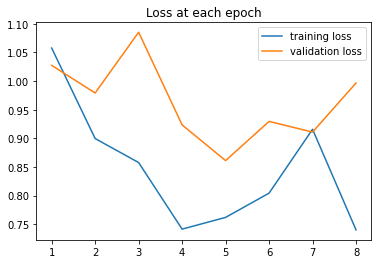

In [66]:
# Plot training and testing losses
plot_losses(train_losses, test_losses)

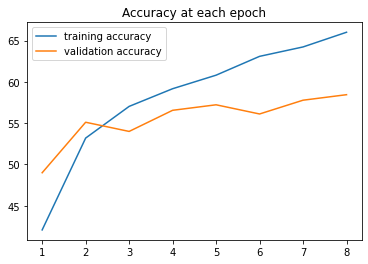

In [67]:
# Plot training and testing accuracies
plot_accuracies(train_accuracies, test_accuracies)

In [76]:
# Convert losses to float values for plotting
train_losses2 = [t.item() for t in train_losses]
test_losses2 = [t.item() for t in test_losses]

## Evaluate model performance

In [68]:
print(f'Train accuracy: {train_accuracies[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies[-1].item():.2f}%')
print(f'Train loss: {train_losses[-1].item():.2f}')
print(f'Test loss: {test_losses[-1].item():.2f}')

Train accuracy: 66.00%
Test accuracy: 58.44%
Train loss: 0.74
Test loss: 1.00


## Display the confusion matrix

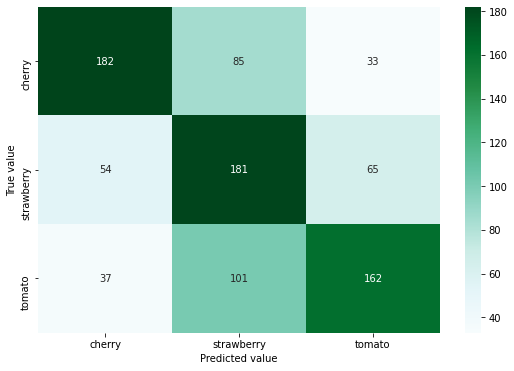

In [69]:
predicted, X_test, y_test = create_cf(test_data, CNNmodel)

## Examine the misses

Index: [    0     1     4     5     6     8    10    16    18    19    20    22
    25    26    27    29    40    44    45    47]
Label: [    2     2     2     0     2     2     1     1     2     0     1     1
     2     1     0     0     1     0     0     2]
Class:  tomato tomato tomato cherry tomato tomato strawberry strawberry tomato cherry strawberry strawberry tomato strawberry cherry cherry strawberry cherry cherry tomato

Guess: [    1     1     1     2     1     1     2     2     1     1     2     2
     1     0     1     1     0     1     2     1]
Class:  strawberry strawberry strawberry tomato strawberry strawberry tomato tomato strawberry strawberry tomato tomato strawberry cherry strawberry strawberry cherry strawberry tomato strawberry


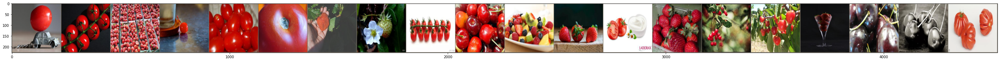

In [70]:
get_missed_predictions(predicted, X_test, y_test)

# Investigate loss function

## Negative Log-Likelihood Loss Function

In [71]:
criterion_nll = nn.NLLLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [72]:
train_losses_nll, test_losses_nll, train_correct_nll, test_correct_nll = train_model(CNNmodel, train_loader, test_loader, criterion_nll, optimizer, epochs)

In [73]:
train_accuracies_nll = get_train_accuracies(train_correct_nll)
test_accuracies_nll = get_test_accuracies(test_correct_nll)

In [77]:
def plot_investigation_losses(train_losses_investigation, invest_train_label, test_losses_investigation, invest_test_label):
    train_losses_investigation = [t.item() for t in train_losses_investigation]
    test_losses_investigation = [t.item() for t in test_losses_investigation]
    plt.figure(figsize = (10,6))
    plt.plot(train_losses2, label='Initial CNNmodel training loss')
    plt.plot(train_losses_investigation, label=invest_train_label)
    plt.plot(test_losses2, label='Initial CNNmodel validation loss')
    plt.plot(test_losses_investigation, label=invest_test_label)
    plt.xticks(np.arange(len(train_losses)), np.arange(1, len(train_losses)+1))
    plt.title('Loss at each epoch')
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

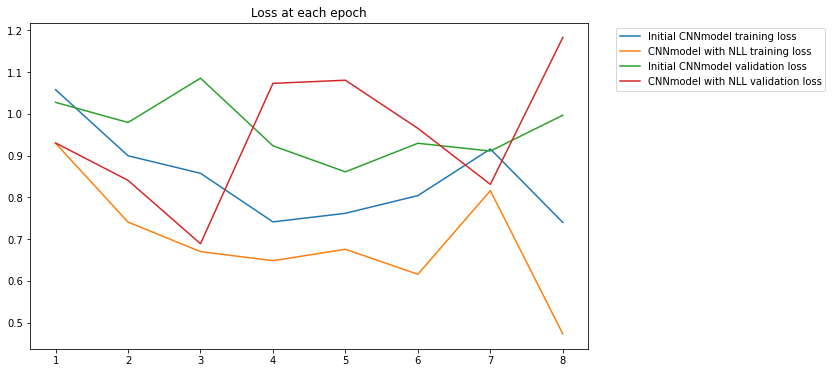

In [78]:
plot_investigation_losses(train_losses_nll, 'CNNmodel with NLL training loss', test_losses_nll, 'CNNmodel with NLL validation loss')

In [79]:
def plot_investigation_accuracies(train_accuracies_investigation, invest_train_label, test_accuracies_investigation, invest_test_label):
    plt.figure(figsize = (10,6))
    plt.plot(train_accuracies, label='Initial CNNmodel training accuracy')
    plt.plot(train_accuracies_investigation, label=invest_train_label)
    plt.plot(test_accuracies, label='Initial CNNmodel validation accuracy')
    plt.plot(test_accuracies_investigation, label=invest_test_label)
    plt.xticks(np.arange(len(train_accuracies)), np.arange(1, len(train_accuracies)+1))
    plt.title('Accuracy at each epoch')
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

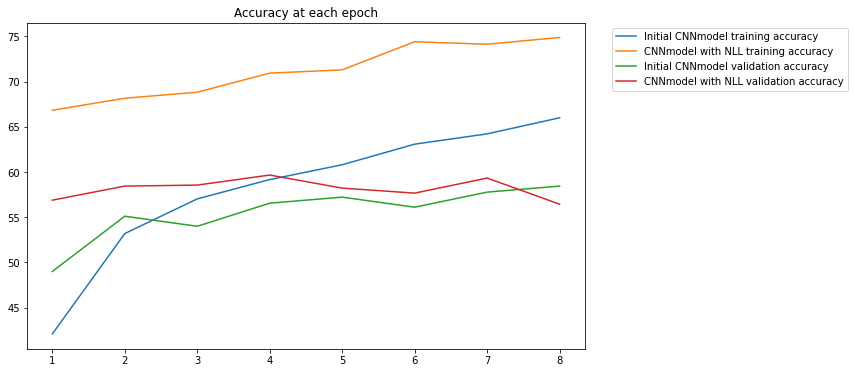

In [80]:
plot_investigation_accuracies(train_accuracies_nll, 'CNNmodel with NLL training accuracy', test_accuracies_nll, 'CNNmodel with NLL validation accuracy')

In [81]:
print(f'Train accuracy: {train_accuracies_nll[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_nll[-1].item():.2f}%')
print(f'Train loss: {train_losses_nll[-1].item():.2f}')
print(f'Test loss: {test_losses_nll[-1].item():.2f}')

Train accuracy: 74.89%
Test accuracy: 56.44%
Train loss: 0.47
Test loss: 1.18


# Investigate minibatch size 

## Batch size = 32

In [82]:
def load_dataset(train_data, test_data, batch_size):
    torch.manual_seed(42)
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)
    return train_loader, test_loader

In [83]:
train_loader1, test_loader1 = load_dataset(train_data, test_data, 32)

In [84]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [85]:
train_losses_32, test_losses_32, train_correct_32, test_correct_32 = train_model(CNNmodel, train_loader1, test_loader1, criterion, optimizer, epochs)

In [86]:
train_accuracies_32 = get_train_accuracies(train_correct_32)
test_accuracies_32 = get_test_accuracies(test_correct_32)

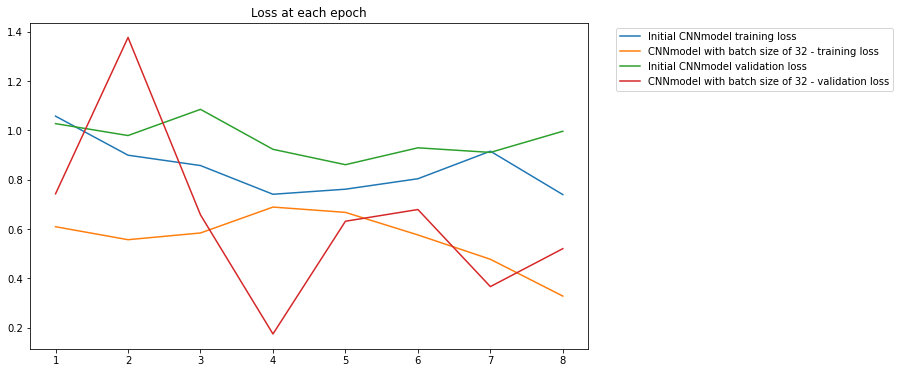

In [87]:
plot_investigation_losses(train_losses_32, 'CNNmodel with batch size of 32 - training loss', test_losses_32, 'CNNmodel with batch size of 32 - validation loss')

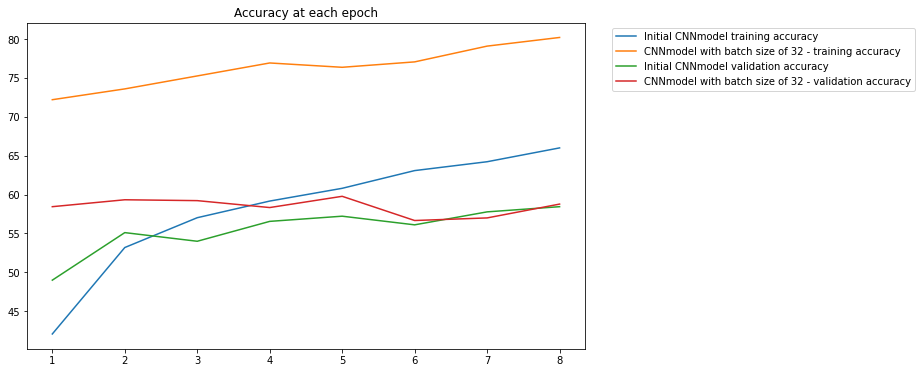

In [88]:
plot_investigation_accuracies(train_accuracies_32, 'CNNmodel with batch size of 32 - training accuracy', test_accuracies_32, 'CNNmodel with batch size of 32 - validation accuracy')

In [89]:
print(f'Train accuracy: {train_accuracies_32[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_32[-1].item():.2f}%')
print(f'Train loss: {train_losses_32[-1].item():.2f}')
print(f'Test loss: {test_losses_32[-1].item():.2f}')

Train accuracy: 80.19%
Test accuracy: 58.78%
Train loss: 0.33
Test loss: 0.52


## Batch size = 64

In [90]:
def load_dataset(train_data, test_data, batch_size):
    torch.manual_seed(42)
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)
    return train_loader, test_loader

In [91]:
train_loader2, test_loader2 = load_dataset(train_data, test_data, 64)

In [92]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [93]:
train_losses_64, test_losses_64, train_correct_64, test_correct_64 = train_model(CNNmodel, train_loader2, test_loader2, criterion, optimizer, epochs)

In [94]:
train_accuracies_64 = get_train_accuracies(train_correct_64)
test_accuracies_64 = get_test_accuracies(test_correct_64)

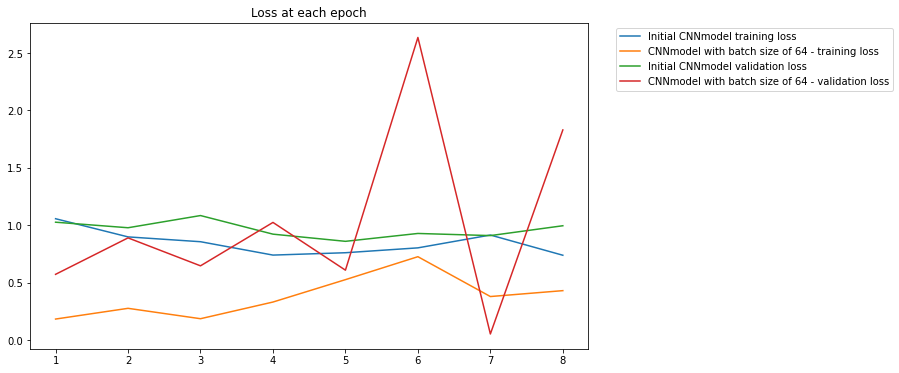

In [95]:
plot_investigation_losses(train_losses_64, 'CNNmodel with batch size of 64 - training loss', test_losses_64, 'CNNmodel with batch size of 64 - validation loss')

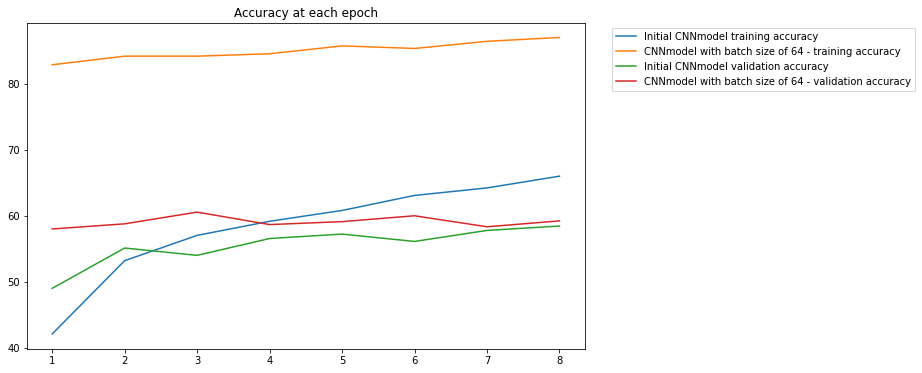

In [96]:
plot_investigation_accuracies(train_accuracies_64, 'CNNmodel with batch size of 64 - training accuracy', test_accuracies_64, 'CNNmodel with batch size of 64 - validation accuracy')

In [97]:
print(f'Train accuracy: {train_accuracies_64[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_64[-1].item():.2f}%')
print(f'Train loss: {train_losses_64[-1].item():.2f}')
print(f'Test loss: {test_losses_64[-1].item():.2f}')

Train accuracy: 87.03%
Test accuracy: 59.22%
Train loss: 0.43
Test loss: 1.83


## Batch size = 128

In [98]:
train_loader3, test_loader3 = load_dataset(train_data, test_data, 128)

In [99]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [100]:
train_losses_128, test_losses_128, train_correct_128, test_correct_128 = train_model(CNNmodel, train_loader3, test_loader3, criterion, optimizer, epochs)

In [101]:
train_accuracies_128 = get_train_accuracies(train_correct_128)
test_accuracies_128 = get_test_accuracies(test_correct_128)

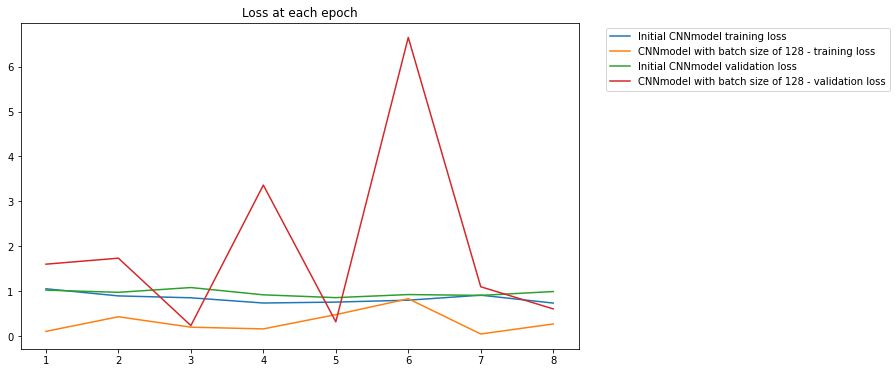

In [102]:
plot_investigation_losses(train_losses_128, 'CNNmodel with batch size of 128 - training loss', test_losses_128, 'CNNmodel with batch size of 128 - validation loss')

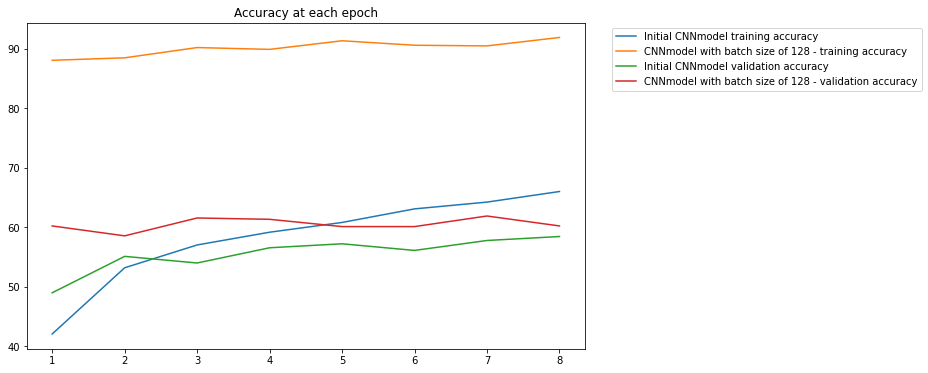

In [103]:
plot_investigation_accuracies(train_accuracies_128, 'CNNmodel with batch size of 128 - training accuracy', test_accuracies_128, 'CNNmodel with batch size of 128 - validation accuracy')

In [104]:
print(f'Train accuracy: {train_accuracies_128[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_128[-1].item():.2f}%')
print(f'Train loss: {train_losses_128[-1].item():.2f}')
print(f'Test loss: {test_losses_128[-1].item():.2f}')

Train accuracy: 91.86%
Test accuracy: 60.22%
Train loss: 0.28
Test loss: 0.61


# Investigate optimisation techniques

## AdaGrad optimizer

In [105]:
criterion = nn.CrossEntropyLoss()
optimizer_ada = torch.optim.Adagrad(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [106]:
train_losses_ada, test_losses_ada, train_correct_ada, test_correct_ada = train_model(CNNmodel, train_loader, test_loader, criterion, optimizer_ada, epochs)

In [107]:
train_accuracies_ada = get_train_accuracies(train_correct_ada)
test_accuracies_ada = get_test_accuracies(test_correct_ada)

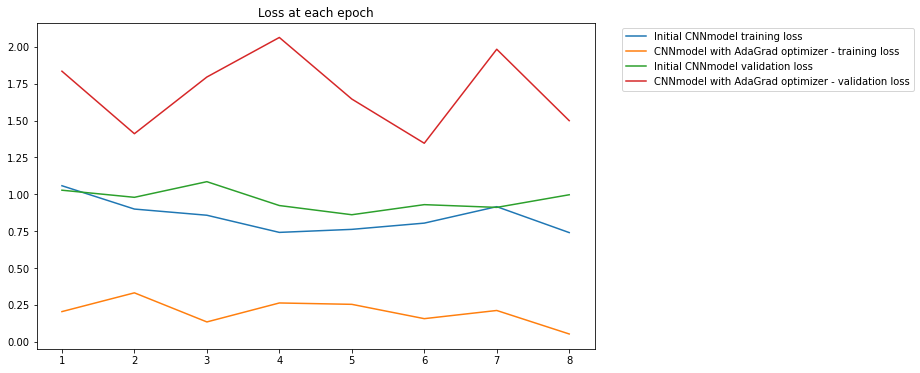

In [108]:
plot_investigation_losses(train_losses_ada, 'CNNmodel with AdaGrad optimizer - training loss', test_losses_ada, 'CNNmodel with AdaGrad optimizer - validation loss')

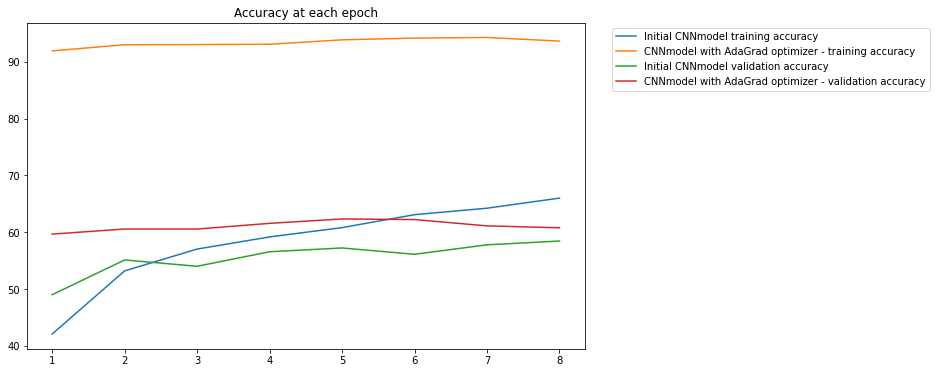

In [109]:
plot_investigation_accuracies(train_accuracies_ada, 'CNNmodel with AdaGrad optimizer - training accuracy', test_accuracies_ada, 'CNNmodel with AdaGrad optimizer - validation accuracy')

In [110]:
print(f'Train accuracy: {train_accuracies_ada[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_ada[-1].item():.2f}%')
print(f'Train loss: {train_losses_ada[-1].item():.2f}')
print(f'Test loss: {test_losses_ada[-1].item():.2f}')

Train accuracy: 93.64%
Test accuracy: 60.78%
Train loss: 0.05
Test loss: 1.50


## RMSProp optimizer

In [111]:
criterion = nn.CrossEntropyLoss()
optimizer_rmsp = torch.optim.RMSprop(CNNmodel.parameters(), lr=0.001)
epochs = 8

In [112]:
train_losses_rmsp, test_losses_rmsp, train_correct_rmsp, test_correct_rmsp = train_model(CNNmodel, train_loader, test_loader, criterion, optimizer_rmsp, epochs)

In [113]:
train_accuracies_rmsp = get_train_accuracies(train_correct_rmsp)
test_accuracies_rmsp = get_test_accuracies(test_correct_rmsp)

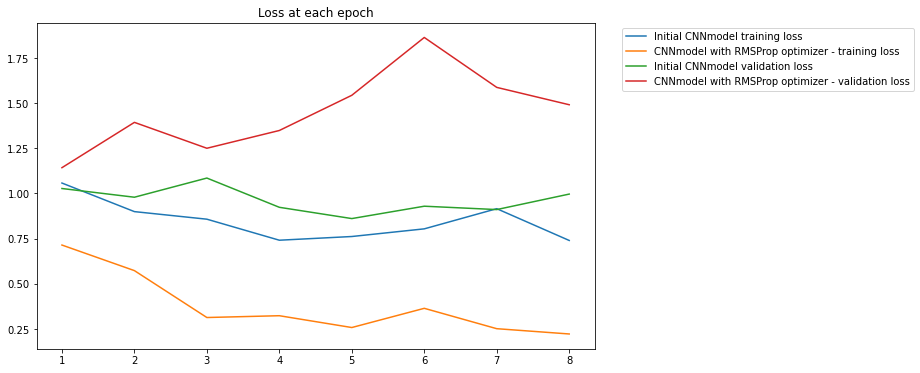

In [114]:
plot_investigation_losses(train_losses_rmsp, 'CNNmodel with RMSProp optimizer - training loss', test_losses_rmsp, 'CNNmodel with RMSProp optimizer - validation loss')

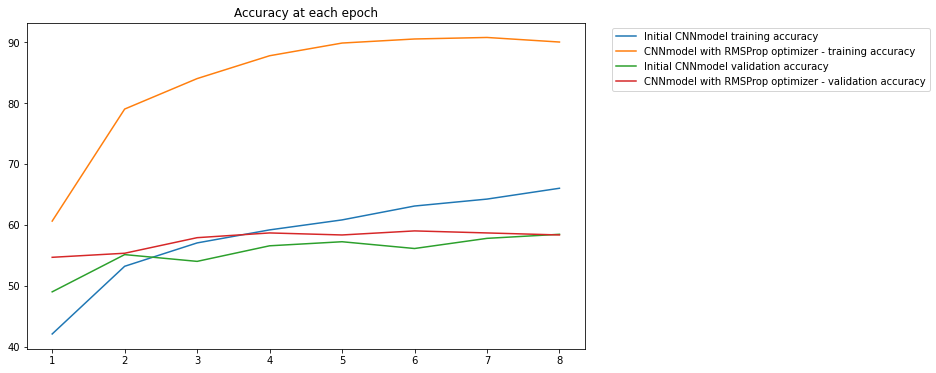

In [115]:
plot_investigation_accuracies(train_accuracies_rmsp, 'CNNmodel with RMSProp optimizer - training accuracy', test_accuracies_rmsp, 'CNNmodel with RMSProp optimizer - validation accuracy')

In [116]:
print(f'Train accuracy: {train_accuracies_rmsp[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_rmsp[-1].item():.2f}%')
print(f'Train loss: {train_losses_rmsp[-1].item():.2f}')
print(f'Test loss: {test_losses_rmsp[-1].item():.2f}')

Train accuracy: 90.00%
Test accuracy: 58.33%
Train loss: 0.22
Test loss: 1.49


# Investigate the regularization strategy

## L2 regularization

In [117]:
class ConvolutionalNetwork2(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 3, 1) #3 input color channels, 6 filters (output channels), kernel size 3x3, stride 1
        self.conv2 = nn.Conv2d(6, 16, 3, 1) #6 filters, 16 filters
        self.fc1 = nn.Linear(54*54*16, 120) #120 flattened out neurons
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 3)

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2) #kernel size 2, stride 2
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, 54*54*16)
        X = F.relu(self.fc1(X))
        X = F.relu(self.fc2(X))
        X = self.fc3(X)
        return F.log_softmax(X, dim=1)

In [118]:
torch.manual_seed(42)
CNNmodel2 = ConvolutionalNetwork2()
CNNmodel2

ConvolutionalNetwork2(
  (conv1): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=46656, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=3, bias=True)
)

In [119]:
criterion = nn.CrossEntropyLoss()
optimizer_l2 = torch.optim.Adam(CNNmodel2.parameters(), lr=0.001, weight_decay=1e-5)
epochs = 8

In [120]:
train_losses_l2, test_losses_l2, train_correct_l2, test_correct_l2 = train_model(CNNmodel2, train_loader, test_loader, criterion, optimizer_l2, epochs)

In [121]:
train_accuracies_l2 = get_train_accuracies(train_correct_l2)
test_accuracies_l2 = get_test_accuracies(test_correct_l2)

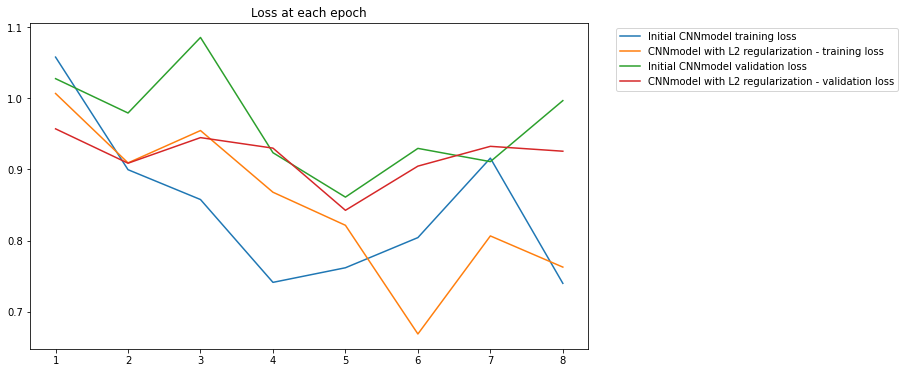

In [122]:
plot_investigation_losses(train_losses_l2, 'CNNmodel with L2 regularization - training loss', test_losses_l2, 'CNNmodel with L2 regularization - validation loss')

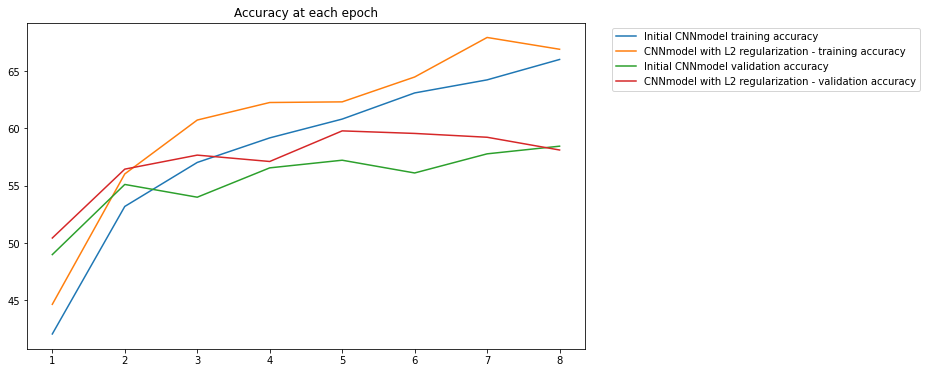

In [123]:
plot_investigation_accuracies(train_accuracies_l2, 'CNNmodel with L2 regularization - training accuracy', test_accuracies_l2, 'CNNmodel with L2 regularization - validation accuracy')

In [124]:
print(f'Train accuracy: {train_accuracies_l2[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_l2[-1].item():.2f}%')
print(f'Train loss: {train_losses_l2[-1].item():.2f}')
print(f'Test loss: {test_losses_l2[-1].item():.2f}')

Train accuracy: 66.89%
Test accuracy: 58.11%
Train loss: 0.76
Test loss: 0.93


## Dropout rate = 0.5

In [125]:
class ConvolutionalNetwork3(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 3, 1) #3 input color channels, 6 filters (output channels), kernel size 3x3, stride 1, padding tbc
        self.conv2 = nn.Conv2d(6, 16, 3, 1) #6 filters, 16 filters
        self.fc1 = nn.Linear(54*54*16, 120) #120 flattened out neurons
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 3)
        self.dropout = nn.Dropout(0.5)

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2) #kernel size 2, stride 2, padding tbc
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, 54*54*16)
        X = self.dropout(X)
        X = F.relu(self.fc1(X))
        X = self.dropout(X)
        X = F.relu(self.fc2(X))
        X = self.fc3(X)
        return F.log_softmax(X, dim=1)

In [126]:
torch.manual_seed(42)
CNNmodel3 = ConvolutionalNetwork3()
CNNmodel3

ConvolutionalNetwork3(
  (conv1): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=46656, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [127]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel3.parameters(), lr=0.001)
epochs = 8

In [128]:
train_losses_05, test_losses_05, train_correct_05, test_correct_05 = train_model(CNNmodel3, train_loader, test_loader, criterion, optimizer, epochs)

In [129]:
train_accuracies_05 = get_train_accuracies(train_correct_05)
test_accuracies_05 = get_test_accuracies(test_correct_05)

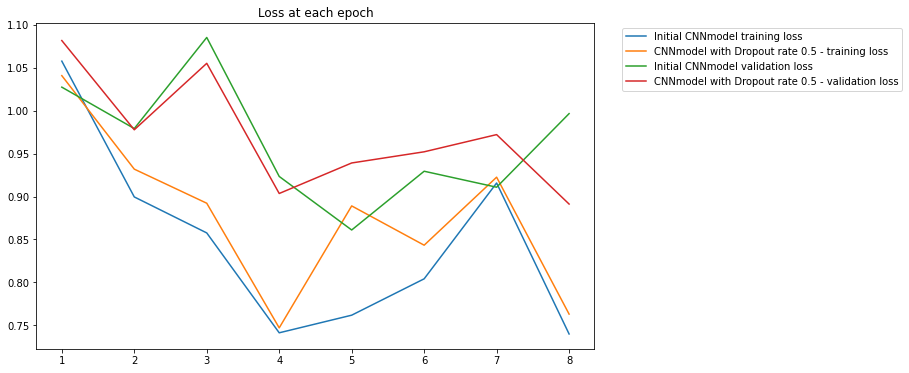

In [130]:
plot_investigation_losses(train_losses_05, 'CNNmodel with Dropout rate 0.5 - training loss', test_losses_05, 'CNNmodel with Dropout rate 0.5 - validation loss')

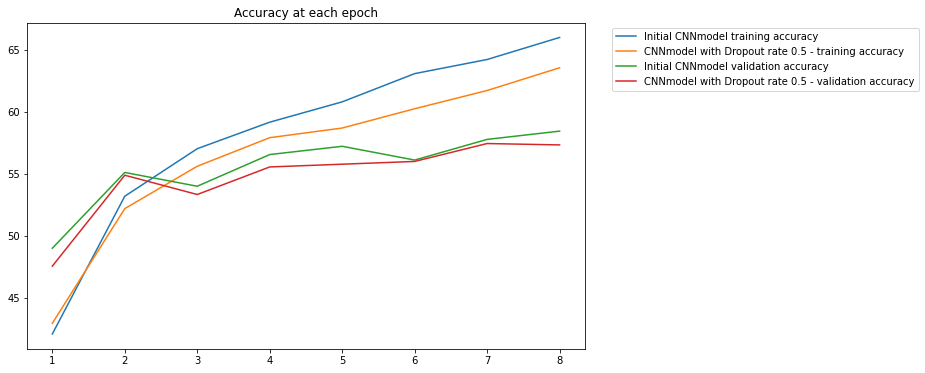

In [131]:
plot_investigation_accuracies(train_accuracies_05, 'CNNmodel with Dropout rate 0.5 - training accuracy', test_accuracies_05, 'CNNmodel with Dropout rate 0.5 - validation accuracy')

In [132]:
print(f'Train accuracy: {train_accuracies_05[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_05[-1].item():.2f}%')
print(f'Train loss: {train_losses_05[-1].item():.2f}')
print(f'Test loss: {test_losses_05[-1].item():.2f}')

Train accuracy: 63.56%
Test accuracy: 57.33%
Train loss: 0.76
Test loss: 0.89


# Use existing models pre-trained

In [133]:
AlexNetmodel = models.alexnet(pretrained=True)
AlexNetmodel

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [134]:
for param in AlexNetmodel.parameters():
    param.requires_grad = False

In [135]:
torch.manual_seed(42)
AlexNetmodel.classifier = nn.Sequential(nn.Linear(9216, 1024),
                                 nn.ReLU(),
                                 nn.Dropout(0.4),
                                 nn.Linear(1024, 3),
                                 nn.LogSoftmax(dim=1))
AlexNetmodel

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Linear(in_features=9216, out_features=1024, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.4, 

In [136]:
count_parameters(AlexNetmodel)

 9437184
    1024
    3072
       3
______
 9441283


In [137]:
criterion_alex = nn.CrossEntropyLoss()
optimizer_alex = torch.optim.Adagrad(AlexNetmodel.classifier.parameters(), lr=0.001)
epochs = 8

In [138]:
train_losses_alex, test_losses_alex, train_correct_alex, test_correct_alex = train_model(AlexNetmodel, train_loader, test_loader, criterion_alex, optimizer_alex, epochs)

In [139]:
train_accuracies_alex = get_train_accuracies(train_correct_alex)
test_accuracies_alex = get_test_accuracies(test_correct_alex)

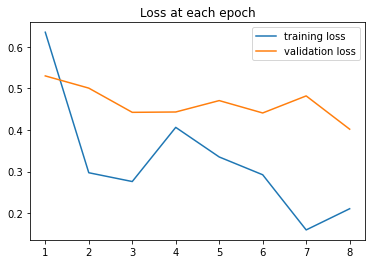

In [140]:
plot_losses(train_losses_alex, test_losses_alex)

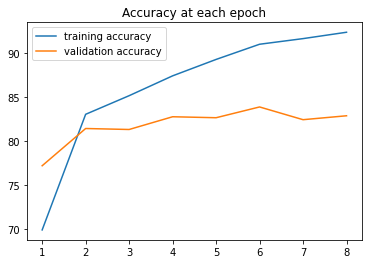

In [141]:
plot_accuracies(train_accuracies_alex, test_accuracies_alex)

## Evaluate model performance

In [142]:
print(f'Train accuracy: {train_accuracies_alex[-1].item():.2f}%')
print(f'Test accuracy: {test_accuracies_alex[-1].item():.2f}%')
print(f'Train loss: {train_losses_alex[-1].item():.2f}')
print(f'Test loss: {test_losses_alex[-1].item():.2f}')

Train accuracy: 92.36%
Test accuracy: 82.89%
Train loss: 0.21
Test loss: 0.40


## Display the confusion matrix

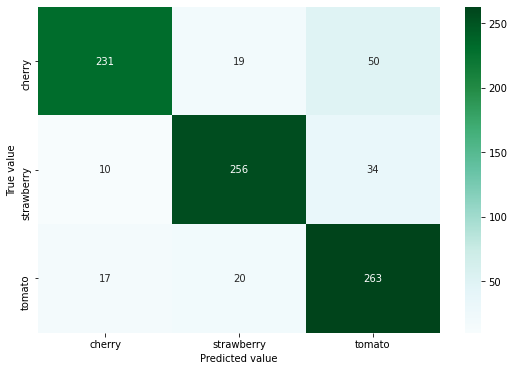

In [143]:
predicted_alex, X_test_alex, y_test_alex = create_cf(test_data, AlexNetmodel)

## Save the trained model

In [144]:
torch.save(AlexNetmodel.state_dict(), 'AlexNetFruitImageCNNModel.pth')

In [145]:
torch.save(
    {
        'epoch': epochs,
        'model_state_dict': AlexNetmodel.state_dict(),
        'optimizer_state_dict': optimizer_alex.state_dict(),
        'criterion_state_dict': criterion_alex.state_dict(),
    },
    'AlexNetFruitImageCNNModel.pth',
)

# Loss & Accuracy summary

In [146]:
input_data = [{"Model": "Initial CNN model",
                "Train loss": round(train_losses[-1].item(),2),
                "Test loss": round(test_losses[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies[-1].item(),2)},
              {"Model": "CNN model with NLL loss function",
              "Train loss": round(train_losses_nll[-1].item(),2),
                "Test loss": round(test_losses_nll[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_nll[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_nll[-1].item(),2)},
              {"Model": "CNN model with batch size 32",
               "Train loss": round(train_losses_32[-1].item(),2),
                "Test loss": round(test_losses_32[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_32[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_32[-1].item(),2)},
              {"Model": "CNN model with batch size 64",
               "Train loss": round(train_losses_64[-1].item(),2),
                "Test loss": round(test_losses_64[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_64[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_64[-1].item(),2)},
              {"Model": "CNN model with batch size 128",
               "Train loss": round(train_losses_128[-1].item(),2),
                "Test loss": round(test_losses_128[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_128[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_128[-1].item(),2)},
             {"Model": "CNN model with optimizer AdaGrad",
               "Train loss": round(train_losses_ada[-1].item(),2),
                "Test loss": round(test_losses_ada[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_ada[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_ada[-1].item(),2)},
             {"Model": "CNN model with optimizer RMSProp",
               "Train loss": round(train_losses_rmsp[-1].item(),2),
                "Test loss": round(test_losses_rmsp[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_rmsp[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_rmsp[-1].item(),2)},
             {"Model": "CNN model with batch L2 Regularization",
               "Train loss": round(train_losses_l2[-1].item(),2),
                "Test loss": round(test_losses_l2[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_l2[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_l2[-1].item(),2)},
             {"Model": "CNN model with Dropout rate 0.5",
               "Train loss": round(train_losses_05[-1].item(),2),
                "Test loss": round(test_losses_05[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_05[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_05[-1].item(),2)},
             {"Model": "Baseline MLP model",
               "Train loss": round(train_losses_mlp[-1].item(),2),
                "Test loss": round(test_losses_mlp[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_mlp[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_mlp[-1].item(),2)},
             {"Model": "Pre-trained AlexNet model",
               "Train loss": round(train_losses_alex[-1].item(),2),
                "Test loss": round(test_losses_alex[-1].item(),2),
                "Train accuracy (%)": round(train_accuracies_alex[-1].item(),2),
                "Test accuracy (%)": round(test_accuracies_alex[-1].item(),2)},]

In [147]:
summary_df = pd.DataFrame(input_data)
summary_df

,Model,Train loss,Test loss,Train accuracy (%),Test accuracy (%)
0,Initial CNN model,0.74,1.00,66.00,58.44
1,CNN model with NLL loss function,0.47,1.18,74.89,56.44
2,CNN model with batch size 32,0.33,0.52,80.19,58.78
3,CNN model with batch size 64,0.43,1.83,87.03,59.22
4,CNN model with batch size 128,0.28,0.61,91.86,60.22
5,CNN model with optimizer AdaGrad,0.05,1.50,93.64,60.78
6,CNN model with optimizer RMSProp,0.22,1.49,90.00,58.33
7,CNN model with batch L2 Regularization,0.76,0.93,66.89,58.11
8,CNN model with Dropout rate 0.5,0.76,0.89,63.56,57.33
9,Baseline MLP model,0.86,2.22,56.89,41.78
